In [ ]:
# Imports
import tensorflow as tf 
import numpy as np
from tensorflow import keras
from keras import layers
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds

In [ ]:
batch_size = 32

# Load dataset
(X_train, y_train), (X_test, y_test) = tf.keras.datasets.cifar10.load_data()
dataset_images = np.r_[X_train, X_test]

# normalize values
dataset_images = dataset_images/ 255.

170508288/170498071 [==============================] - 11s 0us/step


In [ ]:
# Latent dimensions
latent_dim = 16

# sampling function to obtain sample for encoder distribution (reparametrization)
def sampling(args):
  mean, var = args
  # define epsilon as a sample from Gaussian prior
  epsilon = keras.backend.random_normal(shape=keras.backend.shape(mean), mean=0., stddev=1.) 
   # mean + epsilon*sigma
  return mean + keras.backend.exp(var/2)*epsilon   
    

## Encoder

# set input shape to imagesize
encoderInput = keras.Input(shape=(32, 32, 3))

# Convolutional layers of the encoder
x = keras.layers.Conv2D(32, kernel_size=3, strides=2, padding='same')(encoderInput)
x = keras.layers.LeakyReLU()(x)

x = keras.layers.Conv2D(64, kernel_size=3, strides=2, padding='same')(x)
x = keras.layers.LeakyReLU()(x)

x = keras.layers.Conv2D(64, kernel_size=3, strides=2, padding='same')(x)
x = keras.layers.LeakyReLU()(x)
x = keras.layers.Dropout(0.2)(x)

x = keras.layers.Conv2D(128, kernel_size=3, strides=2, padding='same')(x)
x = keras.layers.LeakyReLU()(x)
x = keras.layers.Dropout(0.2)(x)

# shape to provide to decoder
preFlattenShape = keras.backend.int_shape(x)[1:]
    
# flattening layer
x = keras.layers.Flatten()(x)
    
# define mean and sigma (they're the same here, but these are learned independently)
mean = keras.layers.Dense(latent_dim, name = 'mean')(x)
var = keras.layers.Dense(latent_dim, name = 'var')(x)

# output by sampling mean and var from Gaussian prior
encoderOutput = keras.layers.Lambda(sampling, name='encoderOutput')([mean, var]) # use Lambda layer to sample from distribution
# define encoder as model
encoder = keras.Model(encoderInput, [mean, var, encoderOutput], name='Encoder') # output is mean, sigma and z 

## Decoder
# take latent vector z as input
decoderInput = keras.Input(shape = (latent_dim,))
  
# add dense layer using preFlattenShape to get correct dimensions of result image
x = keras.layers.Dense(np.prod(preFlattenShape))(decoderInput)
x = keras.layers.Reshape(preFlattenShape)(x)

# Upscale using transpose convolutional layers
x = keras.layers.Conv2DTranspose(64, kernel_size=3, strides=2, padding='same')(x)
x = keras.layers.LeakyReLU()(x)

x = keras.layers.Conv2DTranspose(64, kernel_size=3, strides=2, padding='same')(x)
x = keras.layers.LeakyReLU()(x)

x = keras.layers.Conv2DTranspose(32, kernel_size=3, strides=2, padding='same')(x)
x = keras.layers.LeakyReLU()(x)

# produce 32x32x3 image
x = keras.layers.Conv2DTranspose(3, kernel_size=3, strides=2, padding='same', activation='sigmoid')(x)
    
# define output and model
decoderOutput = x
decoder = keras.Model(decoderInput, decoderOutput, name='Decoder')

Model: "Encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (None, 16, 16, 32)   896         ['input_1[0][0]']                
                                                                                                  
 leaky_re_lu (LeakyReLU)        (None, 16, 16, 32)   0           ['conv2d[0][0]']                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 8, 8, 64)     18496       ['leaky_re_lu[0][0]']            
                                                                                            

In [ ]:
# class VAE puts the encoder and decoder together, overrides the train_step method and tracks the KL-loss
class VAE(keras.Model):
  def __init__(self, encoder, decoder, **kwargs):
    super(VAE,self).__init__(**kwargs)
    self.encoder = encoder
    self.decoder = decoder
    
    self.totalLossTracker = keras.metrics.Mean(name="totalLoss")
    self.reconstructionLossTracker = keras.metrics.Mean(name="reconstructionLoss")
    self.KLlossTracker = keras.metrics.Mean(name="KLloss")

  # loss metric trackers
  @property
  def metrics(self):
    return [self.totalLossTracker, self.reconstructionLossTracker, self.KLlossTracker]

  # overwrite train_step
  def train_step(self, data):
    with tf.GradientTape() as tape:
      # get samples 
      mean, var, z = self.encoder(data)
      # reconstruct image from samples
      reconstruct = self.decoder(z)
      # get reconstruction loss
      reconstructionLoss = tf.reduce_mean(tf.reduce_sum(keras.losses.binary_crossentropy(data, reconstruct), axis=(1, 2)))

      # compute KL-loss/divergence
      KLloss = -0.5 * (1 + var - tf.square(mean) - tf.exp(var))
      KLloss = tf.reduce_mean(tf.reduce_sum(KLloss, axis=1))

      # get total loss by summing KL-loss and reconstruction loss
      totalLoss = reconstructionLoss + KLloss

      # obtain and apply gradients to VAE to train it
      grads = tape.gradient(totalLoss, self.trainable_weights)
      self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
      # update losses
      self.totalLossTracker.update_state(totalLoss)
      self.reconstructionLossTracker.update_state(reconstructionLoss)
      self.KLlossTracker.update_state(KLloss)
      
      # return all 3 losses
      return {
        "totalLoss": self.totalLossTracker.result(),
        "reconstructionLoss": self.reconstructionLossTracker.result(),
        "KLloss": self.KLlossTracker.result(),
      }

# custom callback method to print images on epoch end
class customCallback(keras.callbacks.Callback):
  def __init__(self, num_images):
    self.num_images = num_images

  # override on_epoch_end to display images after each epoch is done training
  def on_epoch_end(self, epoch, logs=None):
    reconstructed = decoder.predict(np.random.normal(0,1,size=(self.num_images,latent_dim)))

    fig = plt.figure(figsize=(15, 3))
    fig.subplots_adjust(hspace=0.4, wspace=0.4)

    for i in range(self.num_images):
      image = keras.preprocessing.image.array_to_img(reconstructed[i])
      plt.subplot(2, 5, i+1)
      plt.imshow(reconstructed[i])
      plt.xticks([])  
      plt.yticks([]) 
    plt.tight_layout()
    plt.show()



In [ ]:
# Generate some images before training
def vae_generate(num_images=10):
  reconstructed = decoder.predict(np.random.normal(0,1,size=(num_images,latent_dim)))

  fig = plt.figure(figsize=(15, 3))
  fig.subplots_adjust(hspace=0.4, wspace=0.4)

  for i in range(num_images):
    image = keras.preprocessing.image.array_to_img(reconstructed[i])
    plt.subplot(2, 5, i+1)
    plt.imshow(reconstructed[i])
    plt.xticks([])  
    plt.yticks([]) 
  plt.tight_layout()
  plt.show() 
  return reconstructed

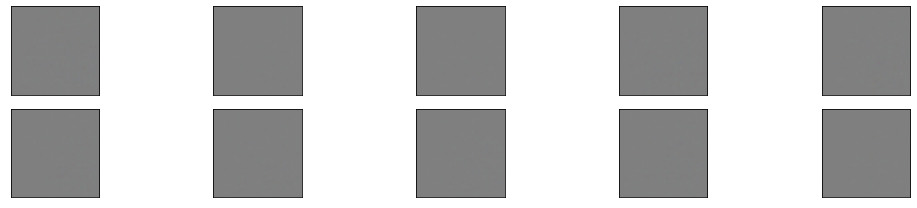

Epoch 1/100
1869/1875 [============================>.] - ETA: 0s - totalLoss: 637.1744 - reconstructionLoss: 623.4719 - KLloss: 13.7029

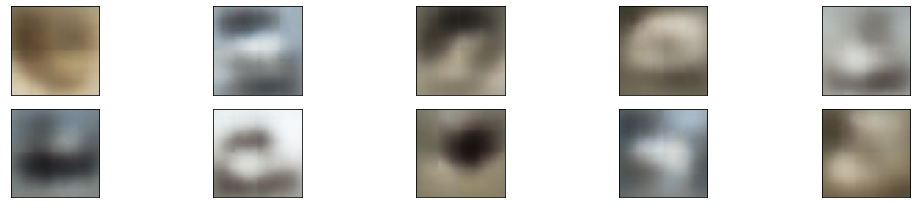

1875/1875 [==============================] - 11s 5ms/step - totalLoss: 637.1447 - reconstructionLoss: 623.4376 - KLloss: 13.7076
Epoch 2/100
1873/1875 [============================>.] - ETA: 0s - totalLoss: 629.0408 - reconstructionLoss: 613.1688 - KLloss: 15.8718

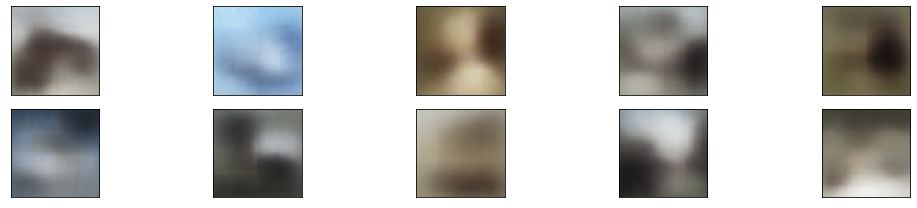

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 629.0476 - reconstructionLoss: 613.1752 - KLloss: 15.8723
Epoch 3/100
1871/1875 [============================>.] - ETA: 0s - totalLoss: 628.2343 - reconstructionLoss: 612.3516 - KLloss: 15.8826

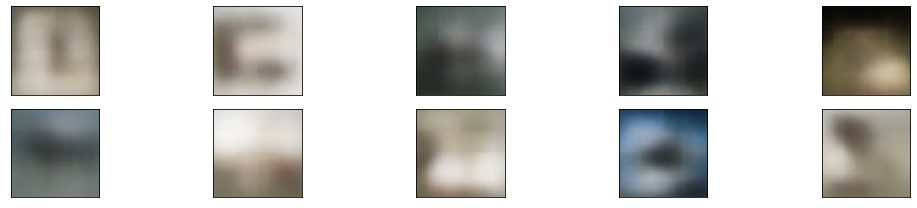

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 628.2463 - reconstructionLoss: 612.3643 - KLloss: 15.8820
Epoch 4/100
1865/1875 [============================>.] - ETA: 0s - totalLoss: 627.9152 - reconstructionLoss: 612.0498 - KLloss: 15.8656

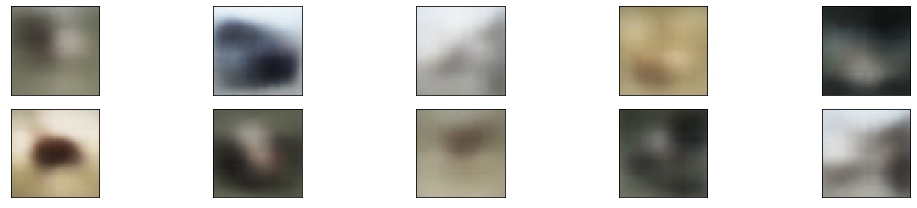

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 627.9042 - reconstructionLoss: 612.0393 - KLloss: 15.8651
Epoch 5/100
1867/1875 [============================>.] - ETA: 0s - totalLoss: 627.6076 - reconstructionLoss: 611.7541 - KLloss: 15.8537

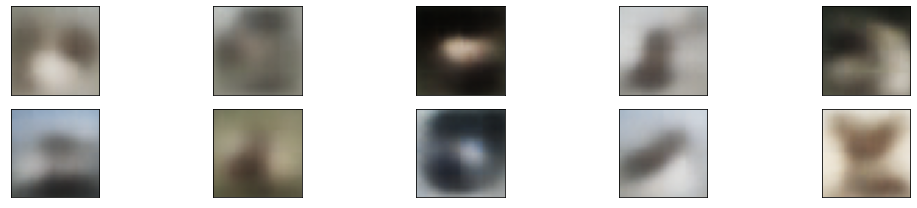

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 627.6299 - reconstructionLoss: 611.7793 - KLloss: 15.8510
Epoch 6/100
1865/1875 [============================>.] - ETA: 0s - totalLoss: 627.3983 - reconstructionLoss: 611.5800 - KLloss: 15.8181

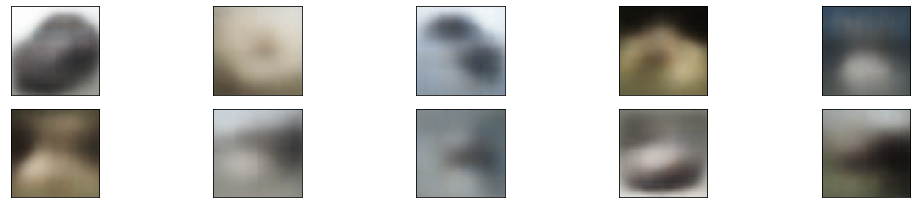

1875/1875 [==============================] - 10s 6ms/step - totalLoss: 627.4199 - reconstructionLoss: 611.6025 - KLloss: 15.8171
Epoch 7/100
1872/1875 [============================>.] - ETA: 0s - totalLoss: 627.3056 - reconstructionLoss: 611.4537 - KLloss: 15.8508

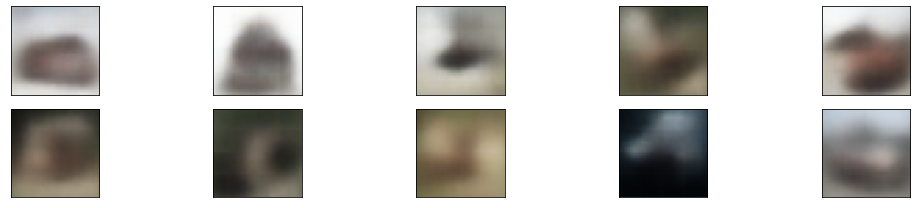

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 627.2801 - reconstructionLoss: 611.4283 - KLloss: 15.8506
Epoch 8/100
1868/1875 [============================>.] - ETA: 0s - totalLoss: 627.1353 - reconstructionLoss: 611.2786 - KLloss: 15.8562

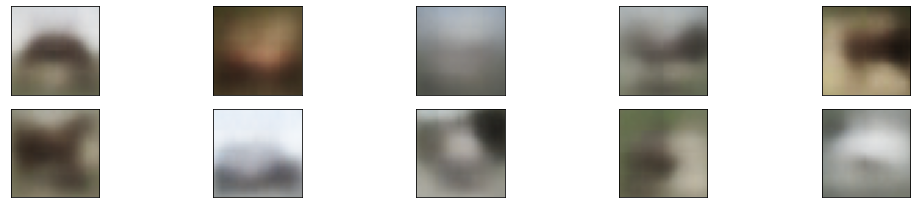

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 627.1519 - reconstructionLoss: 611.2975 - KLloss: 15.8540
Epoch 9/100
1868/1875 [============================>.] - ETA: 0s - totalLoss: 627.0210 - reconstructionLoss: 611.1353 - KLloss: 15.8858

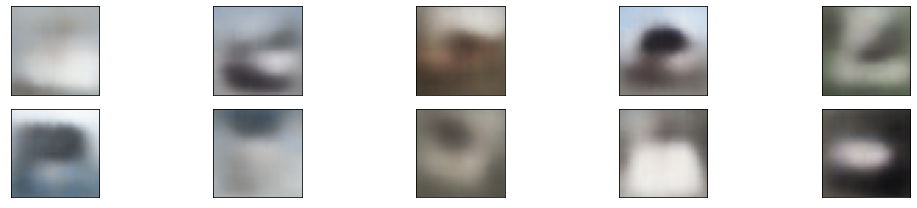

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 627.0464 - reconstructionLoss: 611.1610 - KLloss: 15.8855
Epoch 10/100
1874/1875 [============================>.] - ETA: 0s - totalLoss: 626.9629 - reconstructionLoss: 611.0681 - KLloss: 15.8963

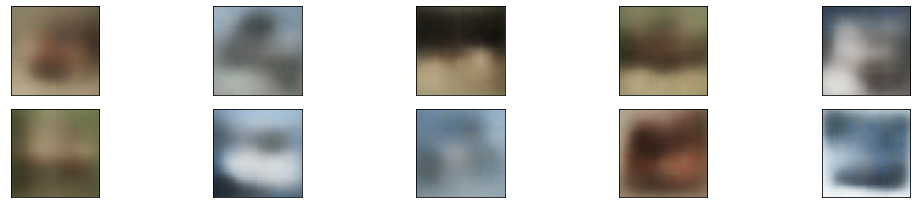

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 626.9647 - reconstructionLoss: 611.0699 - KLloss: 15.8963
Epoch 11/100
1875/1875 [==============================] - ETA: 0s - totalLoss: 626.8789 - reconstructionLoss: 610.9634 - KLloss: 15.9159

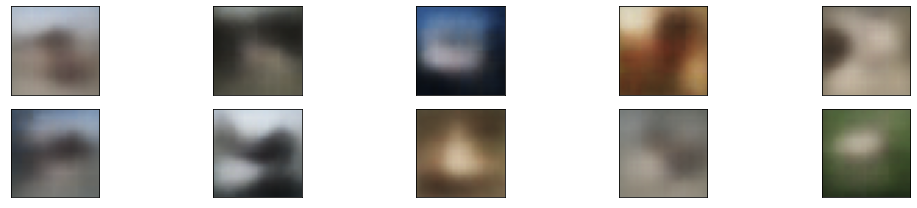

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 626.8789 - reconstructionLoss: 610.9634 - KLloss: 15.9159
Epoch 12/100
1875/1875 [==============================] - ETA: 0s - totalLoss: 626.8295 - reconstructionLoss: 610.9128 - KLloss: 15.9165

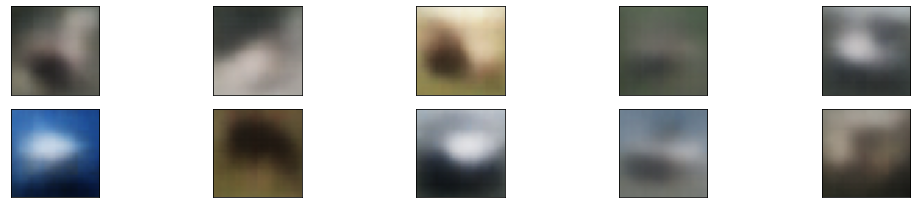

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 626.8295 - reconstructionLoss: 610.9128 - KLloss: 15.9165
Epoch 13/100
1868/1875 [============================>.] - ETA: 0s - totalLoss: 626.7769 - reconstructionLoss: 610.8568 - KLloss: 15.9205

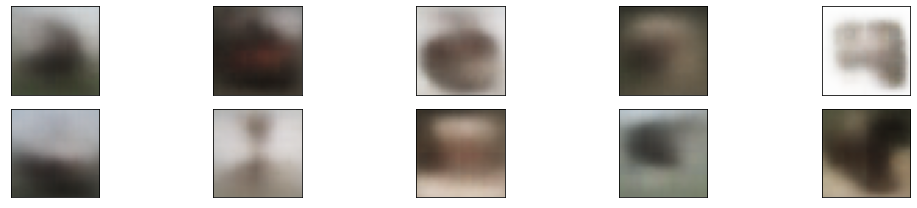

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 626.7797 - reconstructionLoss: 610.8577 - KLloss: 15.9224
Epoch 14/100
1874/1875 [============================>.] - ETA: 0s - totalLoss: 626.6935 - reconstructionLoss: 610.7622 - KLloss: 15.9309

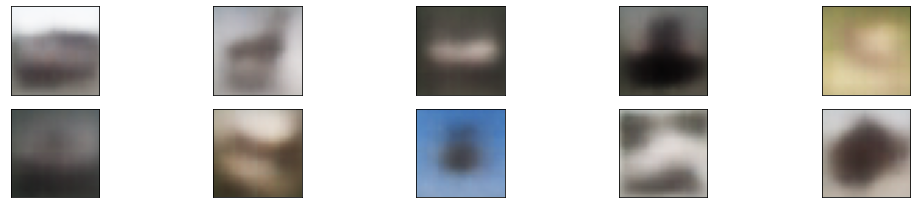

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 626.6935 - reconstructionLoss: 610.7621 - KLloss: 15.9310
Epoch 15/100
1875/1875 [==============================] - ETA: 0s - totalLoss: 626.6692 - reconstructionLoss: 610.7278 - KLloss: 15.9416

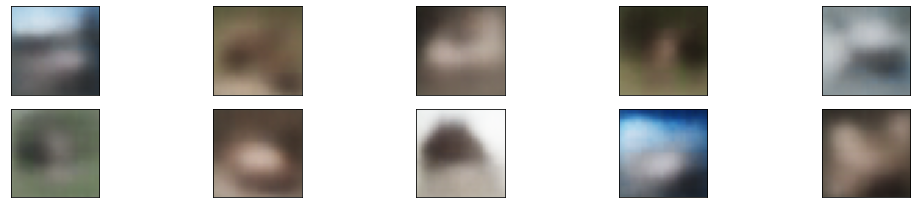

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 626.6692 - reconstructionLoss: 610.7278 - KLloss: 15.9416
Epoch 16/100
1873/1875 [============================>.] - ETA: 0s - totalLoss: 626.6324 - reconstructionLoss: 610.7015 - KLloss: 15.9303

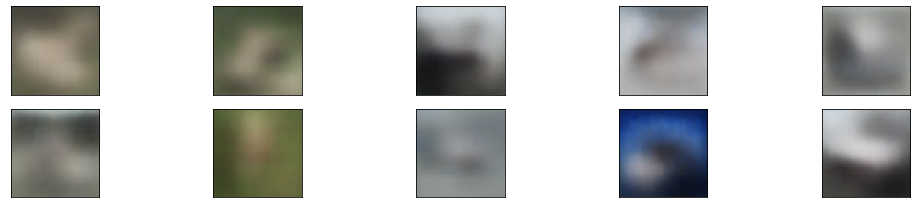

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 626.6255 - reconstructionLoss: 610.6936 - KLloss: 15.9312
Epoch 17/100
1871/1875 [============================>.] - ETA: 0s - totalLoss: 626.6020 - reconstructionLoss: 610.6678 - KLloss: 15.9351

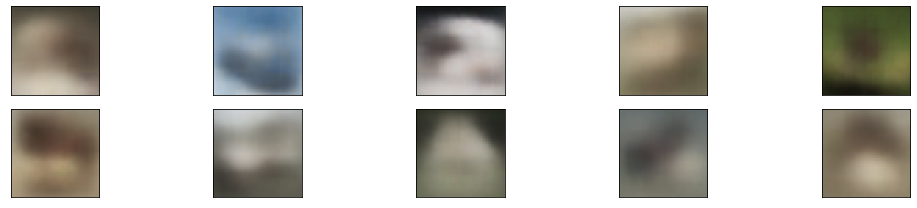

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 626.5843 - reconstructionLoss: 610.6506 - KLloss: 15.9346
Epoch 18/100
1873/1875 [============================>.] - ETA: 0s - totalLoss: 626.5500 - reconstructionLoss: 610.6022 - KLloss: 15.9477

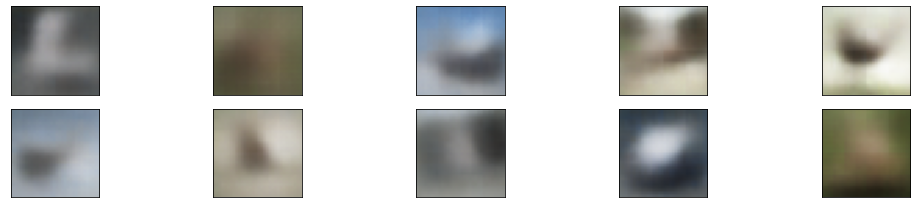

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 626.5508 - reconstructionLoss: 610.6030 - KLloss: 15.9477
Epoch 19/100
1871/1875 [============================>.] - ETA: 0s - totalLoss: 626.5495 - reconstructionLoss: 610.5879 - KLloss: 15.9619

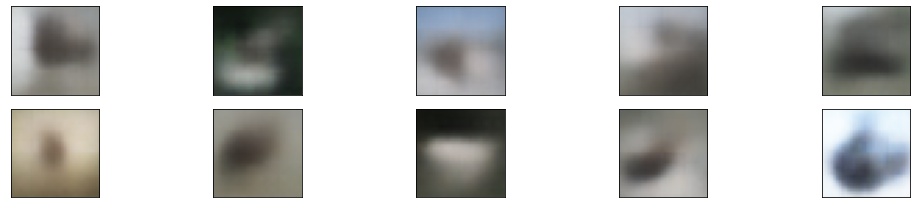

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 626.5259 - reconstructionLoss: 610.5629 - KLloss: 15.9635
Epoch 20/100
1874/1875 [============================>.] - ETA: 0s - totalLoss: 626.4896 - reconstructionLoss: 610.5329 - KLloss: 15.9565

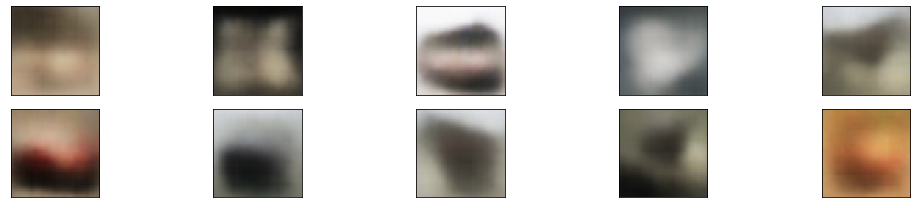

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 626.4991 - reconstructionLoss: 610.5430 - KLloss: 15.9558
Epoch 21/100
1870/1875 [============================>.] - ETA: 0s - totalLoss: 626.5110 - reconstructionLoss: 610.5368 - KLloss: 15.9750

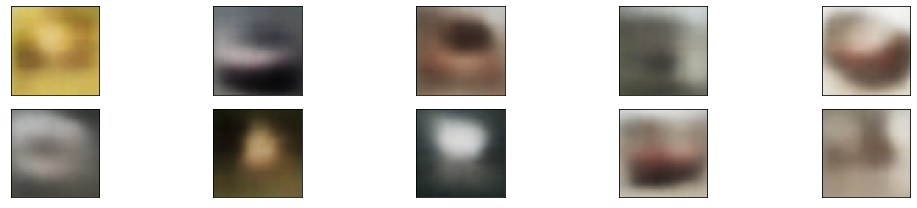

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 626.4971 - reconstructionLoss: 610.5223 - KLloss: 15.9756
Epoch 22/100
1870/1875 [============================>.] - ETA: 0s - totalLoss: 626.4130 - reconstructionLoss: 610.4321 - KLloss: 15.9807

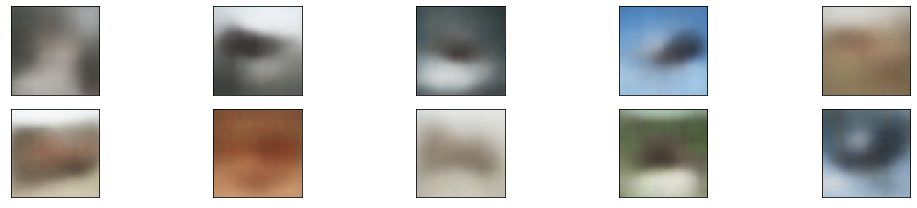

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 626.4172 - reconstructionLoss: 610.4364 - KLloss: 15.9807
Epoch 23/100
1868/1875 [============================>.] - ETA: 0s - totalLoss: 626.3838 - reconstructionLoss: 610.4265 - KLloss: 15.9574

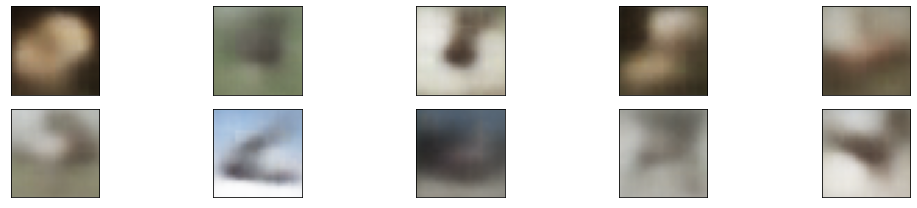

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 626.3889 - reconstructionLoss: 610.4308 - KLloss: 15.9581
Epoch 24/100
1872/1875 [============================>.] - ETA: 0s - totalLoss: 626.3961 - reconstructionLoss: 610.3948 - KLloss: 16.0009

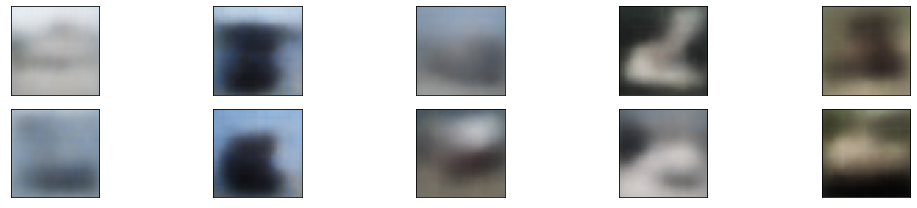

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 626.4082 - reconstructionLoss: 610.4076 - KLloss: 16.0004
Epoch 25/100
1870/1875 [============================>.] - ETA: 0s - totalLoss: 626.3568 - reconstructionLoss: 610.3447 - KLloss: 16.0116

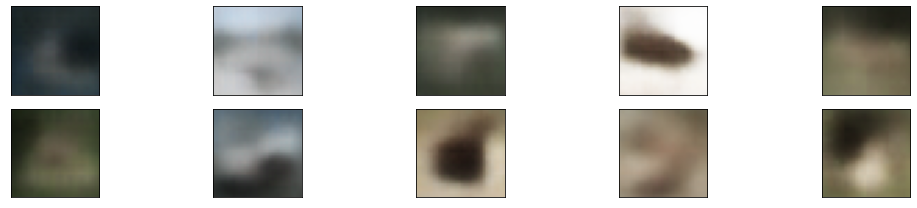

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 626.3824 - reconstructionLoss: 610.3715 - KLloss: 16.0105
Epoch 26/100
1868/1875 [============================>.] - ETA: 0s - totalLoss: 626.3148 - reconstructionLoss: 610.3153 - KLloss: 15.9990

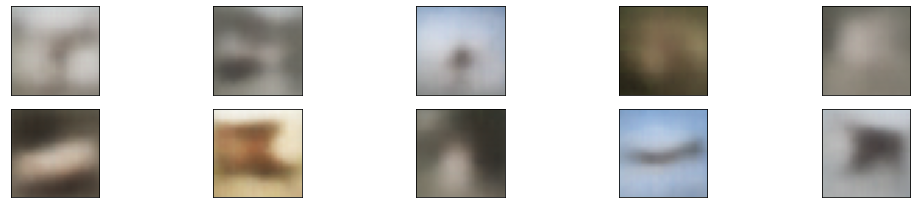

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 626.3306 - reconstructionLoss: 610.3324 - KLloss: 15.9977
Epoch 27/100
1869/1875 [============================>.] - ETA: 0s - totalLoss: 626.3184 - reconstructionLoss: 610.3169 - KLloss: 16.0013

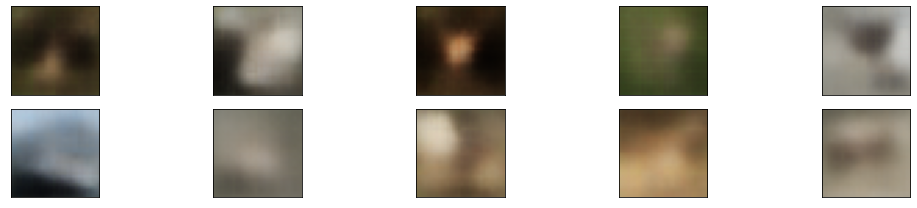

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 626.3317 - reconstructionLoss: 610.3315 - KLloss: 15.9999
Epoch 28/100
1870/1875 [============================>.] - ETA: 0s - totalLoss: 626.3093 - reconstructionLoss: 610.3383 - KLloss: 15.9701

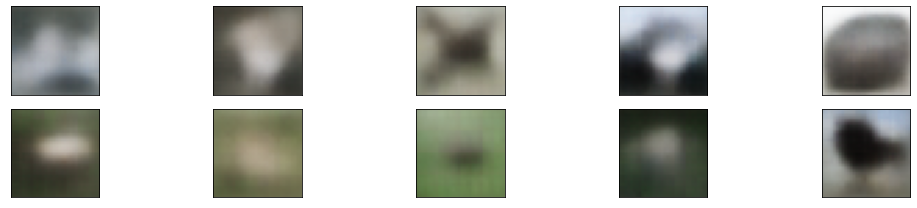

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 626.2939 - reconstructionLoss: 610.3217 - KLloss: 15.9712
Epoch 29/100
1867/1875 [============================>.] - ETA: 0s - totalLoss: 626.2910 - reconstructionLoss: 610.2841 - KLloss: 16.0058

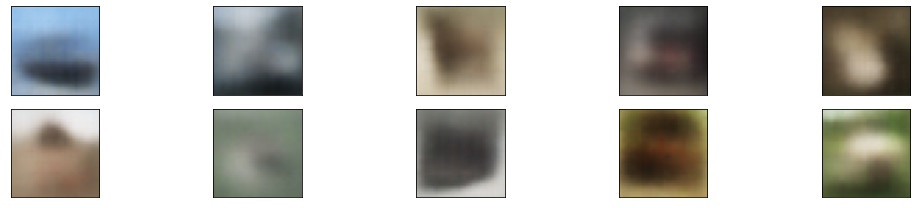

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 626.2938 - reconstructionLoss: 610.2875 - KLloss: 16.0053
Epoch 30/100
1871/1875 [============================>.] - ETA: 0s - totalLoss: 626.2811 - reconstructionLoss: 610.2907 - KLloss: 15.9904

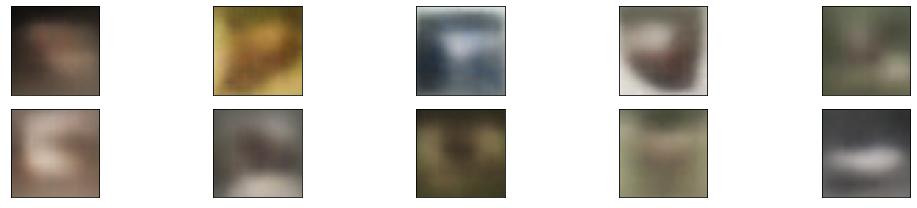

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 626.2658 - reconstructionLoss: 610.2744 - KLloss: 15.9914
Epoch 31/100
1866/1875 [============================>.] - ETA: 0s - totalLoss: 626.2545 - reconstructionLoss: 610.2437 - KLloss: 16.0096

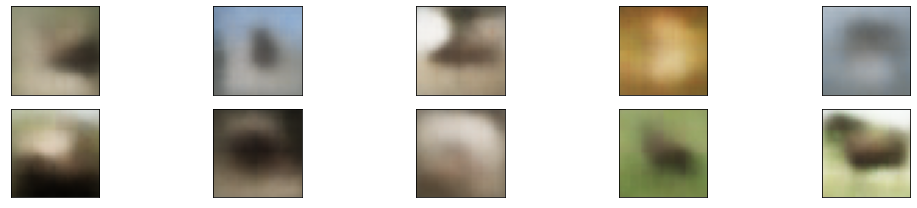

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 626.2584 - reconstructionLoss: 610.2476 - KLloss: 16.0095
Epoch 32/100
1868/1875 [============================>.] - ETA: 0s - totalLoss: 626.2524 - reconstructionLoss: 610.2358 - KLloss: 16.0162

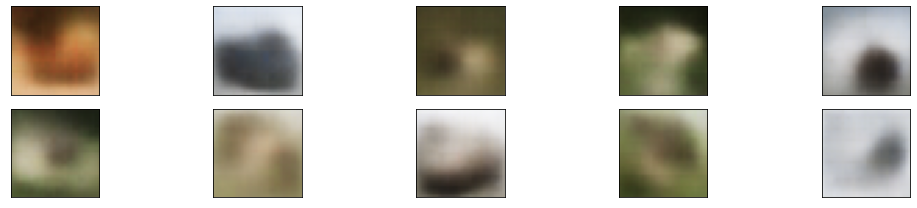

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 626.2580 - reconstructionLoss: 610.2412 - KLloss: 16.0163
Epoch 33/100
1867/1875 [============================>.] - ETA: 0s - totalLoss: 626.2369 - reconstructionLoss: 610.2228 - KLloss: 16.0140

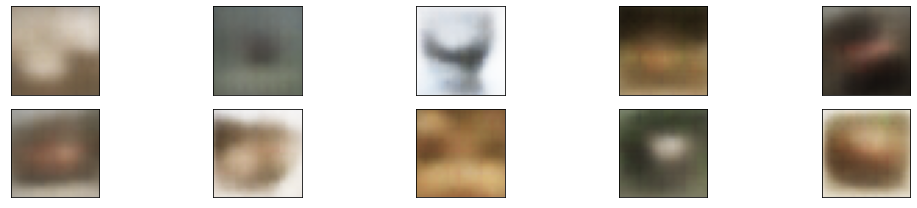

1875/1875 [==============================] - 10s 6ms/step - totalLoss: 626.2215 - reconstructionLoss: 610.2066 - KLloss: 16.0148
Epoch 34/100
1872/1875 [============================>.] - ETA: 0s - totalLoss: 626.2411 - reconstructionLoss: 610.1982 - KLloss: 16.0438

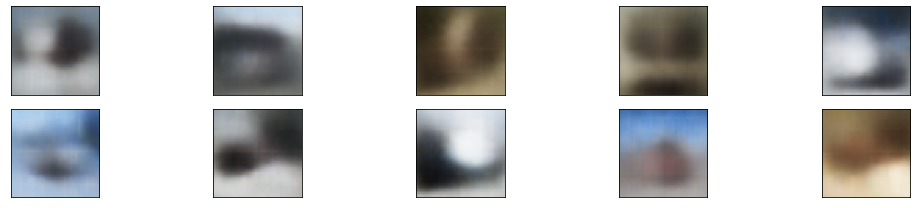

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 626.2437 - reconstructionLoss: 610.2007 - KLloss: 16.0438
Epoch 35/100
1871/1875 [============================>.] - ETA: 0s - totalLoss: 626.1811 - reconstructionLoss: 610.1700 - KLloss: 16.0108

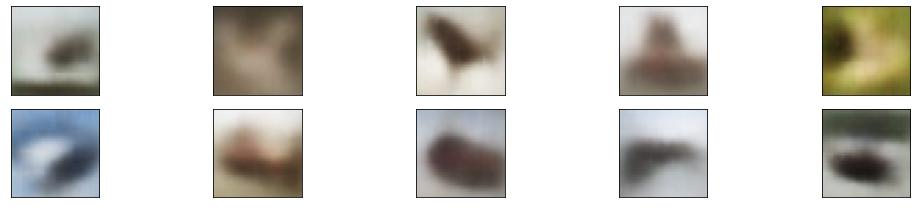

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 626.1981 - reconstructionLoss: 610.1871 - KLloss: 16.0105
Epoch 36/100
1875/1875 [==============================] - ETA: 0s - totalLoss: 626.2091 - reconstructionLoss: 610.1801 - KLloss: 16.0301

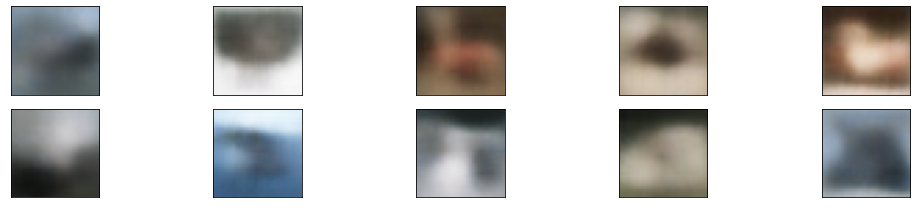

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 626.2091 - reconstructionLoss: 610.1801 - KLloss: 16.0301
Epoch 37/100
1874/1875 [============================>.] - ETA: 0s - totalLoss: 626.1817 - reconstructionLoss: 610.1732 - KLloss: 16.0074

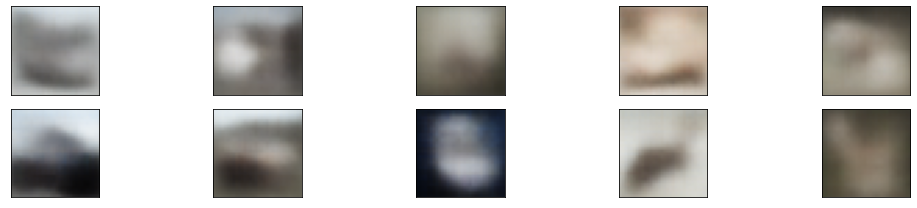

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 626.1909 - reconstructionLoss: 610.1830 - KLloss: 16.0068
Epoch 38/100
1873/1875 [============================>.] - ETA: 0s - totalLoss: 626.1915 - reconstructionLoss: 610.1624 - KLloss: 16.0280

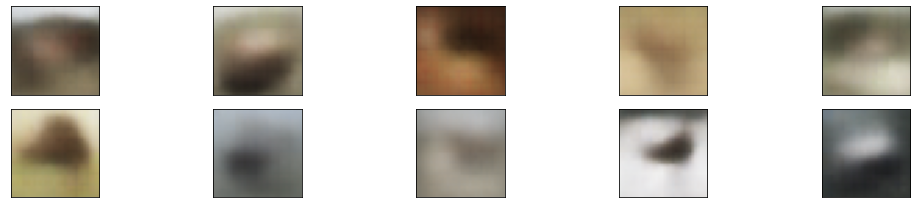

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 626.1758 - reconstructionLoss: 610.1455 - KLloss: 16.0293
Epoch 39/100
1870/1875 [============================>.] - ETA: 0s - totalLoss: 626.1983 - reconstructionLoss: 610.1653 - KLloss: 16.0336

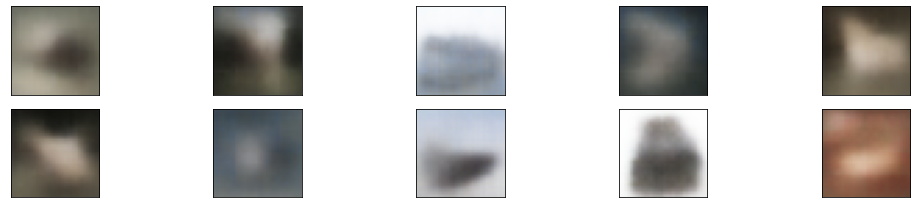

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 626.1758 - reconstructionLoss: 610.1439 - KLloss: 16.0326
Epoch 40/100
1874/1875 [============================>.] - ETA: 0s - totalLoss: 626.1547 - reconstructionLoss: 610.1302 - KLloss: 16.0254

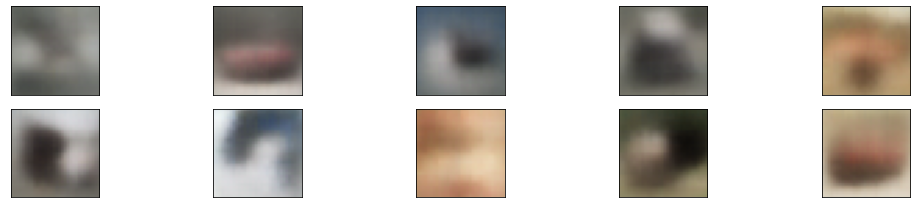

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 626.1637 - reconstructionLoss: 610.1393 - KLloss: 16.0254
Epoch 41/100
1875/1875 [==============================] - ETA: 0s - totalLoss: 626.1227 - reconstructionLoss: 610.0829 - KLloss: 16.0401

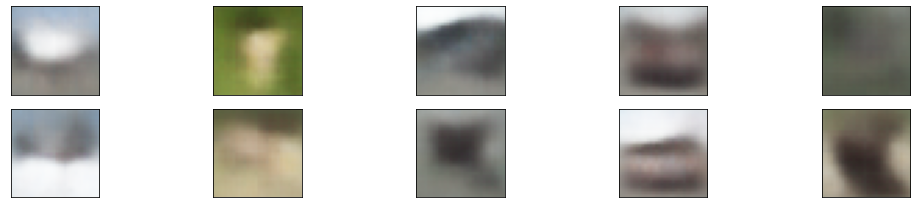

1875/1875 [==============================] - 10s 5ms/step - totalLoss: 626.1227 - reconstructionLoss: 610.0829 - KLloss: 16.0401
Epoch 42/100
1875/1875 [==============================] - ETA: 0s - totalLoss: 626.1008 - reconstructionLoss: 610.0555 - KLloss: 16.0450

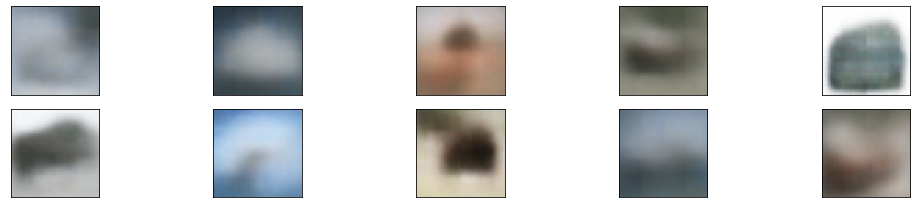

1875/1875 [==============================] - 10s 6ms/step - totalLoss: 626.1008 - reconstructionLoss: 610.0555 - KLloss: 16.0450
Epoch 43/100
1872/1875 [============================>.] - ETA: 0s - totalLoss: 626.1082 - reconstructionLoss: 610.0737 - KLloss: 16.0348

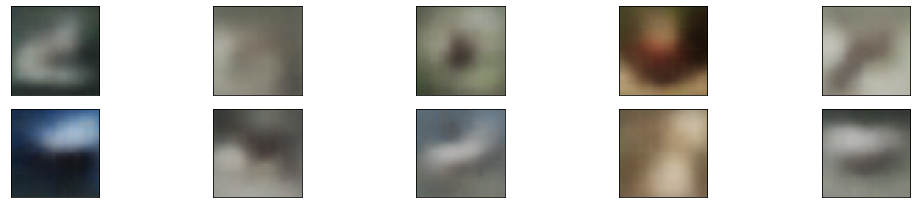

1875/1875 [==============================] - 10s 6ms/step - totalLoss: 626.1262 - reconstructionLoss: 610.0917 - KLloss: 16.0347
Epoch 44/100
1873/1875 [============================>.] - ETA: 0s - totalLoss: 626.1149 - reconstructionLoss: 610.0724 - KLloss: 16.0423

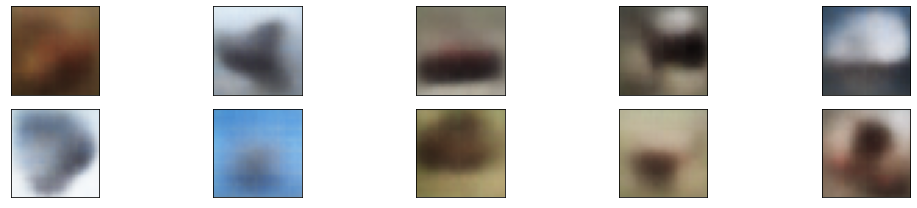

1875/1875 [==============================] - 10s 6ms/step - totalLoss: 626.1080 - reconstructionLoss: 610.0651 - KLloss: 16.0426
Epoch 45/100
1866/1875 [============================>.] - ETA: 0s - totalLoss: 626.1500 - reconstructionLoss: 610.1032 - KLloss: 16.0469

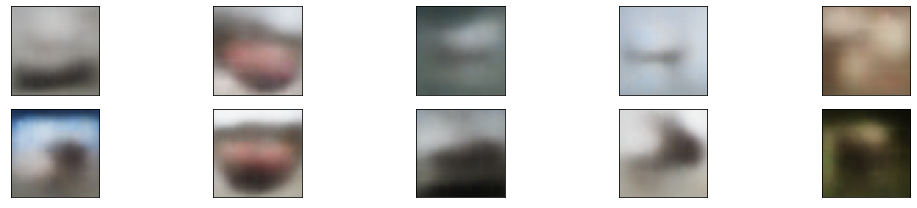

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 626.1169 - reconstructionLoss: 610.0672 - KLloss: 16.0498
Epoch 46/100
1871/1875 [============================>.] - ETA: 0s - totalLoss: 626.0748 - reconstructionLoss: 610.0272 - KLloss: 16.0477

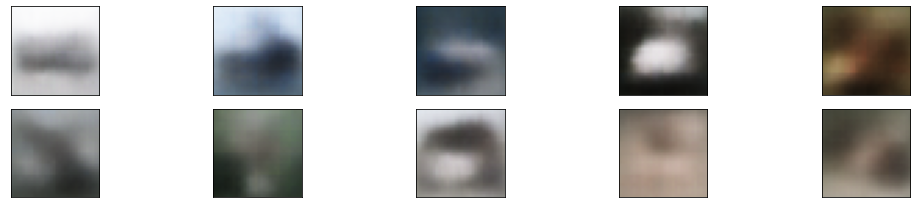

1875/1875 [==============================] - 10s 6ms/step - totalLoss: 626.0949 - reconstructionLoss: 610.0483 - KLloss: 16.0468
Epoch 47/100
1875/1875 [==============================] - ETA: 0s - totalLoss: 626.0709 - reconstructionLoss: 610.0304 - KLloss: 16.0394

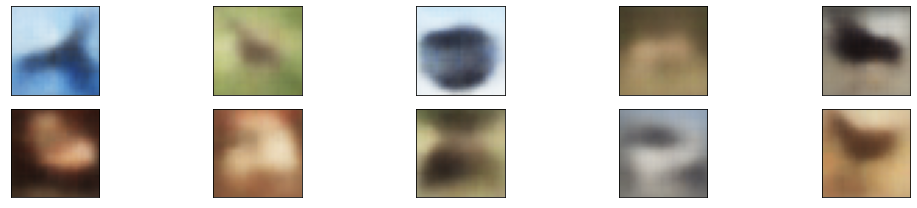

1875/1875 [==============================] - 10s 6ms/step - totalLoss: 626.0709 - reconstructionLoss: 610.0304 - KLloss: 16.0394
Epoch 48/100
1870/1875 [============================>.] - ETA: 0s - totalLoss: 626.1047 - reconstructionLoss: 610.0600 - KLloss: 16.0444

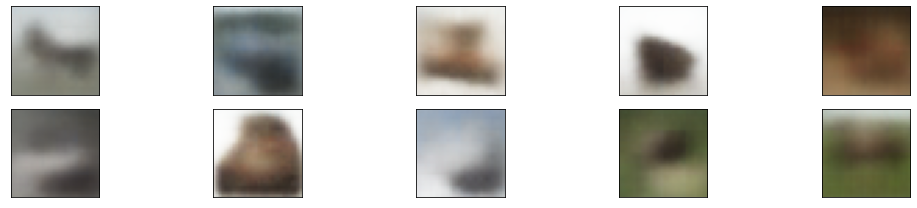

1875/1875 [==============================] - 10s 6ms/step - totalLoss: 626.0782 - reconstructionLoss: 610.0312 - KLloss: 16.0467
Epoch 49/100
1871/1875 [============================>.] - ETA: 0s - totalLoss: 626.0569 - reconstructionLoss: 609.9913 - KLloss: 16.0657

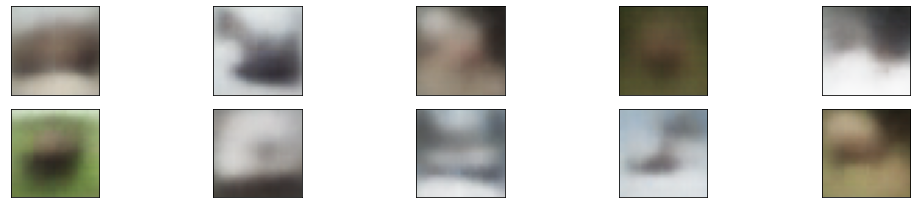

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 626.0607 - reconstructionLoss: 609.9949 - KLloss: 16.0659
Epoch 50/100
1871/1875 [============================>.] - ETA: 0s - totalLoss: 626.0408 - reconstructionLoss: 609.9952 - KLloss: 16.0453

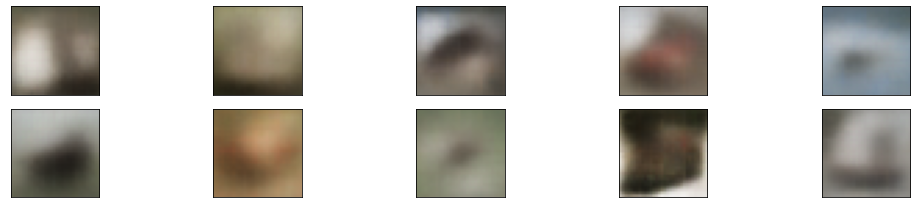

1875/1875 [==============================] - 10s 6ms/step - totalLoss: 626.0551 - reconstructionLoss: 610.0101 - KLloss: 16.0446
Epoch 51/100
1874/1875 [============================>.] - ETA: 0s - totalLoss: 626.0447 - reconstructionLoss: 609.9805 - KLloss: 16.0635

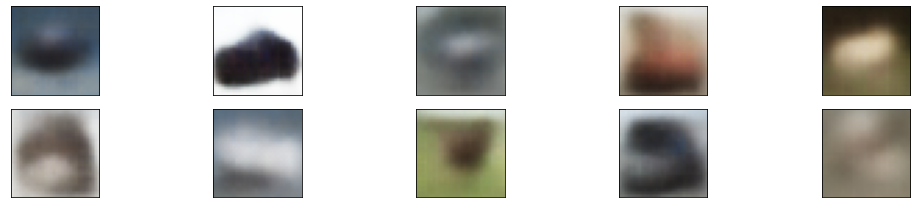

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 626.0465 - reconstructionLoss: 609.9824 - KLloss: 16.0634
Epoch 52/100
1867/1875 [============================>.] - ETA: 0s - totalLoss: 626.0606 - reconstructionLoss: 609.9969 - KLloss: 16.0629

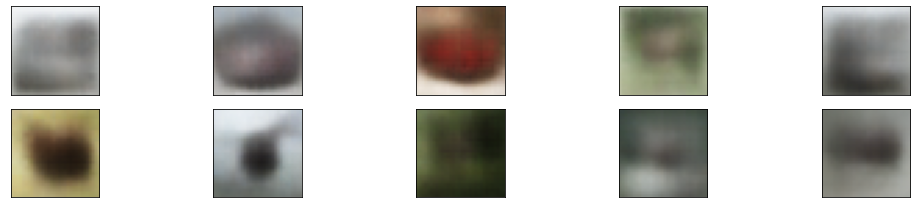

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 626.0564 - reconstructionLoss: 609.9918 - KLloss: 16.0638
Epoch 53/100
1874/1875 [============================>.] - ETA: 0s - totalLoss: 626.0323 - reconstructionLoss: 609.9694 - KLloss: 16.0620

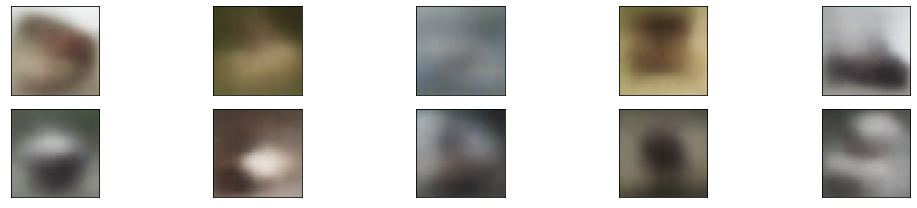

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 626.0389 - reconstructionLoss: 609.9763 - KLloss: 16.0616
Epoch 54/100
1866/1875 [============================>.] - ETA: 0s - totalLoss: 625.9930 - reconstructionLoss: 609.9324 - KLloss: 16.0608

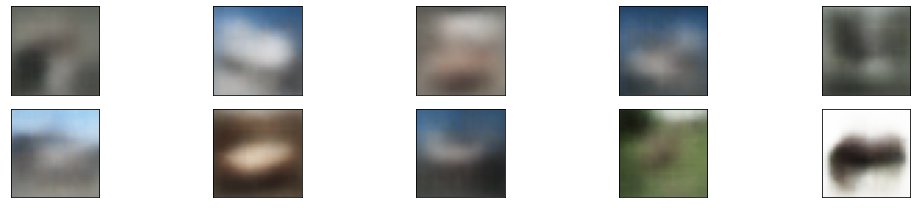

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 626.0275 - reconstructionLoss: 609.9661 - KLloss: 16.0616
Epoch 55/100
1867/1875 [============================>.] - ETA: 0s - totalLoss: 626.0480 - reconstructionLoss: 609.9766 - KLloss: 16.0708

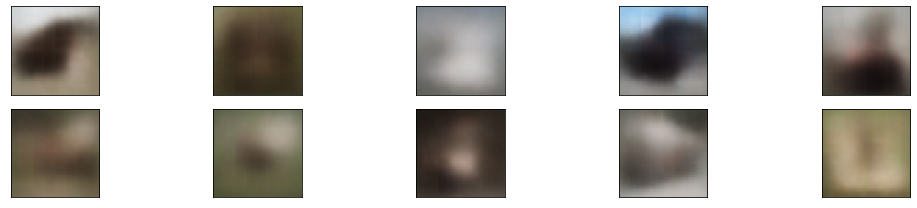

1875/1875 [==============================] - 10s 6ms/step - totalLoss: 626.0316 - reconstructionLoss: 609.9598 - KLloss: 16.0709
Epoch 56/100
1867/1875 [============================>.] - ETA: 0s - totalLoss: 626.0077 - reconstructionLoss: 609.9281 - KLloss: 16.0796

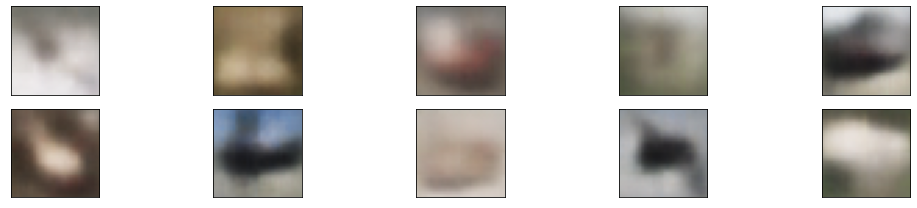

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 626.0135 - reconstructionLoss: 609.9350 - KLloss: 16.0784
Epoch 57/100
1870/1875 [============================>.] - ETA: 0s - totalLoss: 626.0329 - reconstructionLoss: 609.9736 - KLloss: 16.0595

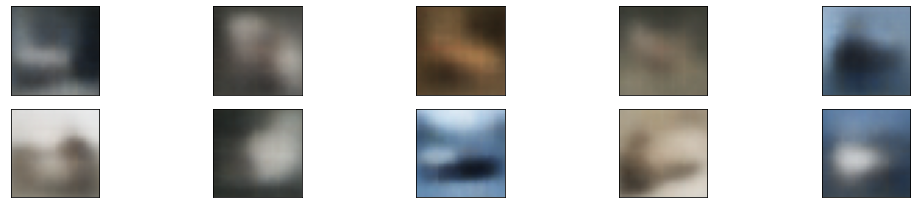

1875/1875 [==============================] - 13s 7ms/step - totalLoss: 626.0084 - reconstructionLoss: 609.9479 - KLloss: 16.0608
Epoch 58/100
1874/1875 [============================>.] - ETA: 0s - totalLoss: 625.9976 - reconstructionLoss: 609.9308 - KLloss: 16.0673

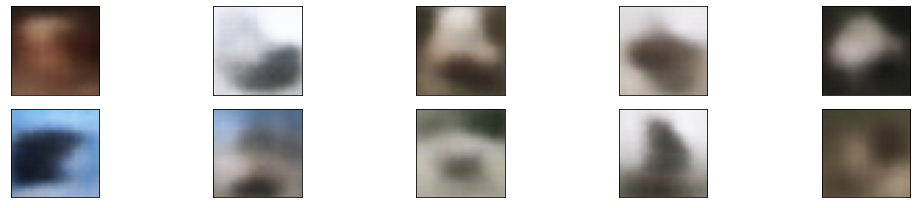

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.9947 - reconstructionLoss: 609.9279 - KLloss: 16.0674
Epoch 59/100
1867/1875 [============================>.] - ETA: 0s - totalLoss: 625.9973 - reconstructionLoss: 609.9194 - KLloss: 16.0778

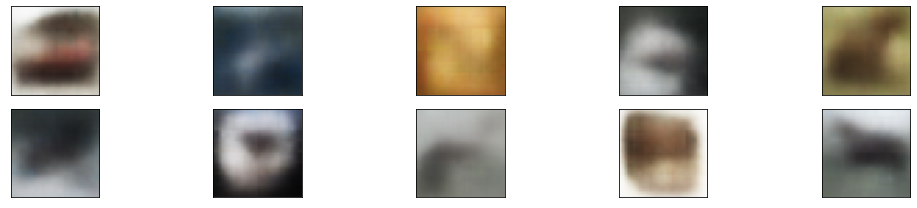

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 626.0033 - reconstructionLoss: 609.9232 - KLloss: 16.0800
Epoch 60/100
1872/1875 [============================>.] - ETA: 0s - totalLoss: 625.9877 - reconstructionLoss: 609.9113 - KLloss: 16.0768

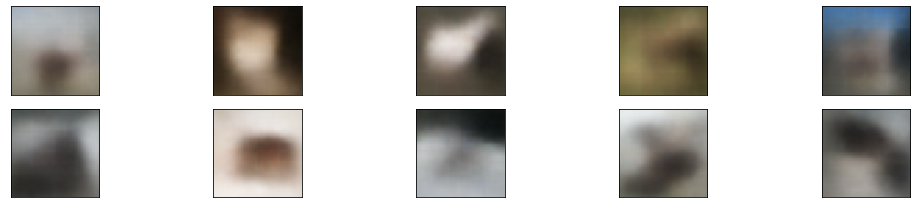

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.9993 - reconstructionLoss: 609.9231 - KLloss: 16.0766
Epoch 61/100
1873/1875 [============================>.] - ETA: 0s - totalLoss: 625.9775 - reconstructionLoss: 609.9087 - KLloss: 16.0694

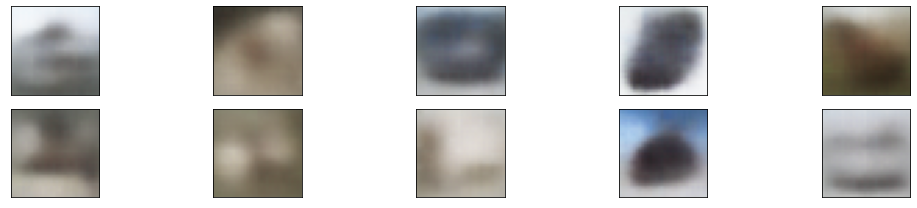

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.9850 - reconstructionLoss: 609.9161 - KLloss: 16.0694
Epoch 62/100
1867/1875 [============================>.] - ETA: 0s - totalLoss: 625.9789 - reconstructionLoss: 609.9008 - KLloss: 16.0782

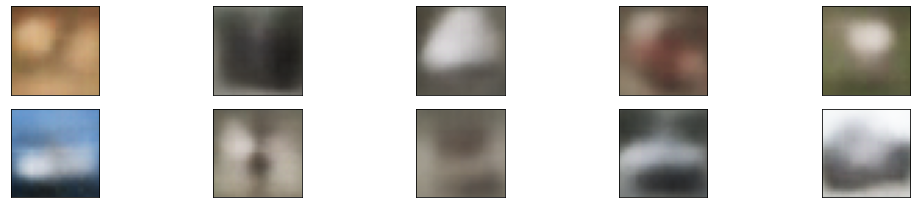

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.9878 - reconstructionLoss: 609.9102 - KLloss: 16.0777
Epoch 63/100
1872/1875 [============================>.] - ETA: 0s - totalLoss: 625.9377 - reconstructionLoss: 609.8729 - KLloss: 16.0647

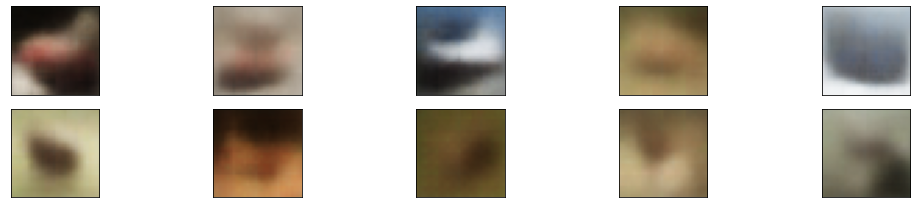

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.9552 - reconstructionLoss: 609.8906 - KLloss: 16.0644
Epoch 64/100
1871/1875 [============================>.] - ETA: 0s - totalLoss: 625.9810 - reconstructionLoss: 609.8949 - KLloss: 16.0857

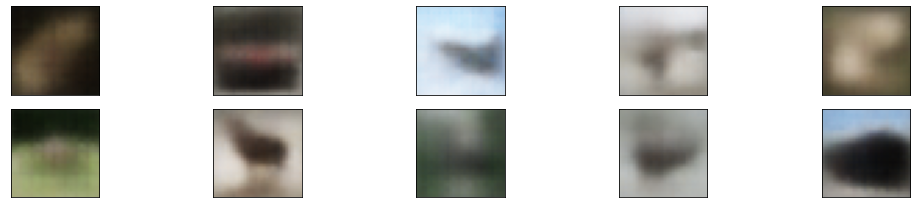

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.9689 - reconstructionLoss: 609.8821 - KLloss: 16.0864
Epoch 65/100
1867/1875 [============================>.] - ETA: 0s - totalLoss: 625.9857 - reconstructionLoss: 609.8821 - KLloss: 16.1038

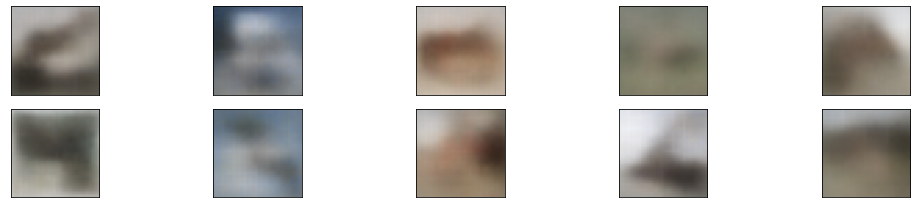

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.9810 - reconstructionLoss: 609.8780 - KLloss: 16.1030
Epoch 66/100
1870/1875 [============================>.] - ETA: 0s - totalLoss: 626.0132 - reconstructionLoss: 609.9260 - KLloss: 16.0860

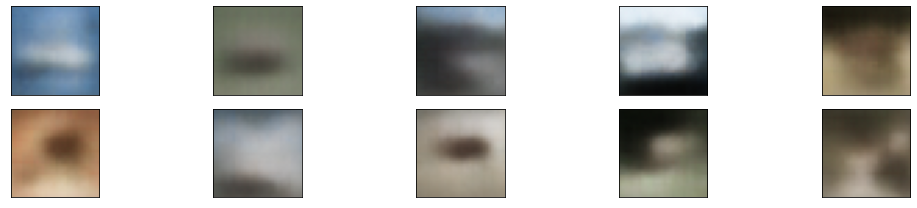

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.9777 - reconstructionLoss: 609.8887 - KLloss: 16.0878
Epoch 67/100
1873/1875 [============================>.] - ETA: 0s - totalLoss: 625.9490 - reconstructionLoss: 609.8770 - KLloss: 16.0723

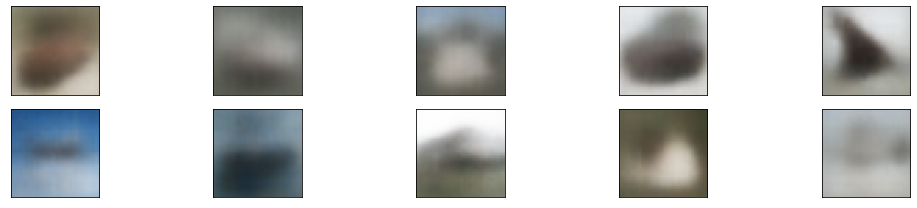

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.9537 - reconstructionLoss: 609.8815 - KLloss: 16.0724
Epoch 68/100
1869/1875 [============================>.] - ETA: 0s - totalLoss: 625.9767 - reconstructionLoss: 609.9011 - KLloss: 16.0752

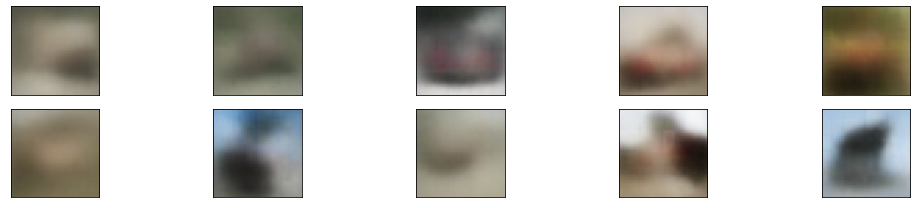

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.9601 - reconstructionLoss: 609.8842 - KLloss: 16.0756
Epoch 69/100
1874/1875 [============================>.] - ETA: 0s - totalLoss: 625.9337 - reconstructionLoss: 609.8446 - KLloss: 16.0896

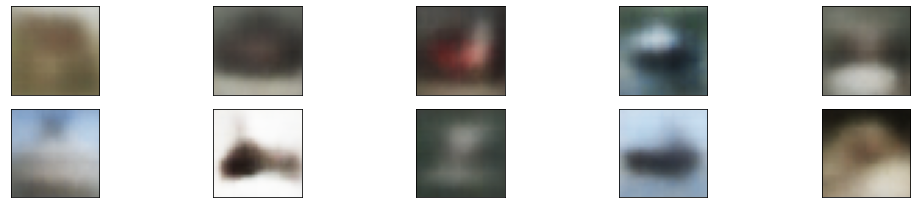

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.9293 - reconstructionLoss: 609.8402 - KLloss: 16.0897
Epoch 70/100
1868/1875 [============================>.] - ETA: 0s - totalLoss: 625.9424 - reconstructionLoss: 609.8556 - KLloss: 16.0869

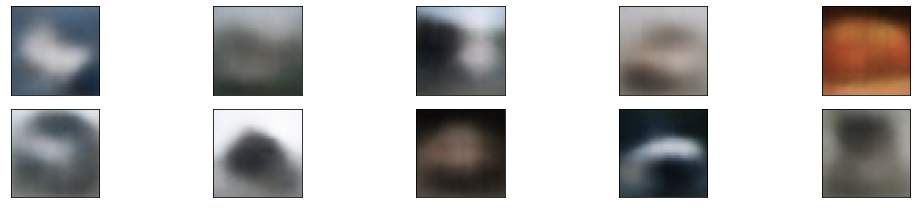

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.9351 - reconstructionLoss: 609.8477 - KLloss: 16.0875
Epoch 71/100
1867/1875 [============================>.] - ETA: 0s - totalLoss: 625.9149 - reconstructionLoss: 609.8233 - KLloss: 16.0913

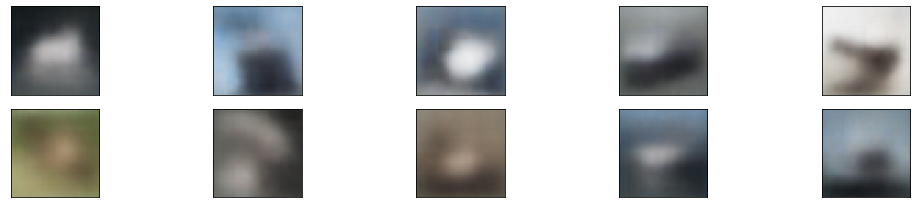

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.9337 - reconstructionLoss: 609.8428 - KLloss: 16.0908
Epoch 72/100
1867/1875 [============================>.] - ETA: 0s - totalLoss: 625.9260 - reconstructionLoss: 609.8347 - KLloss: 16.0917

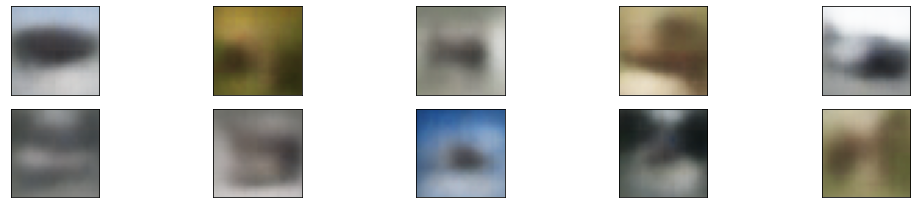

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.9376 - reconstructionLoss: 609.8494 - KLloss: 16.0884
Epoch 73/100
1869/1875 [============================>.] - ETA: 0s - totalLoss: 625.9727 - reconstructionLoss: 609.8680 - KLloss: 16.1048

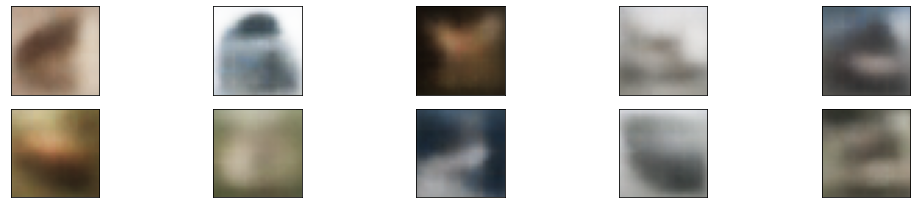

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.9445 - reconstructionLoss: 609.8383 - KLloss: 16.1063
Epoch 74/100
1866/1875 [============================>.] - ETA: 0s - totalLoss: 625.9260 - reconstructionLoss: 609.8428 - KLloss: 16.0826

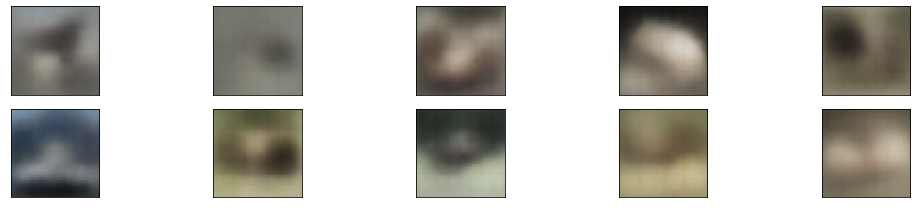

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.9178 - reconstructionLoss: 609.8343 - KLloss: 16.0830
Epoch 75/100
1873/1875 [============================>.] - ETA: 0s - totalLoss: 625.8784 - reconstructionLoss: 609.7996 - KLloss: 16.0785

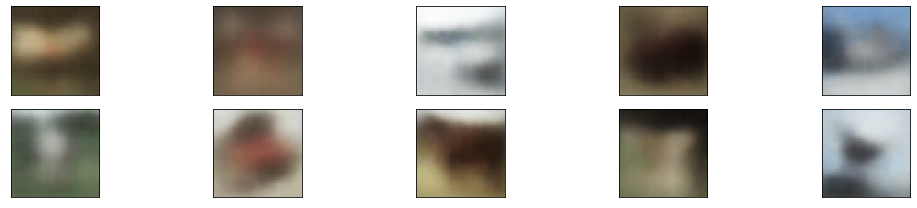

1875/1875 [==============================] - 10s 6ms/step - totalLoss: 625.8956 - reconstructionLoss: 609.8181 - KLloss: 16.0772
Epoch 76/100
1872/1875 [============================>.] - ETA: 0s - totalLoss: 625.8954 - reconstructionLoss: 609.8338 - KLloss: 16.0609

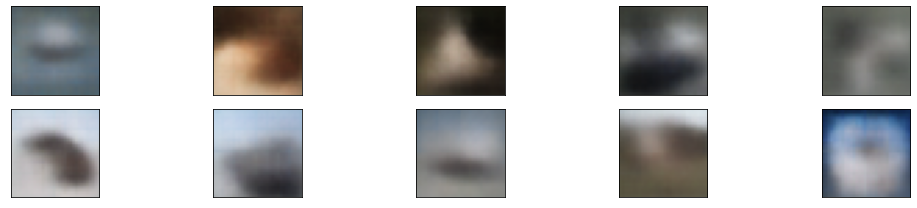

1875/1875 [==============================] - 10s 6ms/step - totalLoss: 625.8874 - reconstructionLoss: 609.8258 - KLloss: 16.0608
Epoch 77/100
1872/1875 [============================>.] - ETA: 0s - totalLoss: 625.9090 - reconstructionLoss: 609.8241 - KLloss: 16.0848

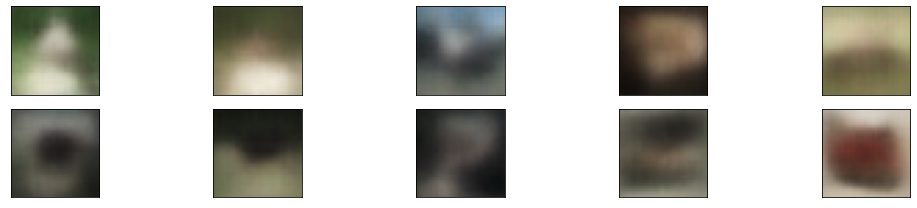

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.9062 - reconstructionLoss: 609.8214 - KLloss: 16.0848
Epoch 78/100
1869/1875 [============================>.] - ETA: 0s - totalLoss: 625.8598 - reconstructionLoss: 609.8082 - KLloss: 16.0517

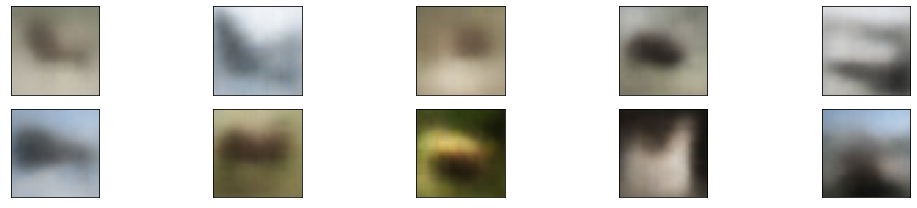

1875/1875 [==============================] - 10s 6ms/step - totalLoss: 625.8560 - reconstructionLoss: 609.8030 - KLloss: 16.0529
Epoch 79/100
1875/1875 [==============================] - ETA: 0s - totalLoss: 625.8915 - reconstructionLoss: 609.7979 - KLloss: 16.0933

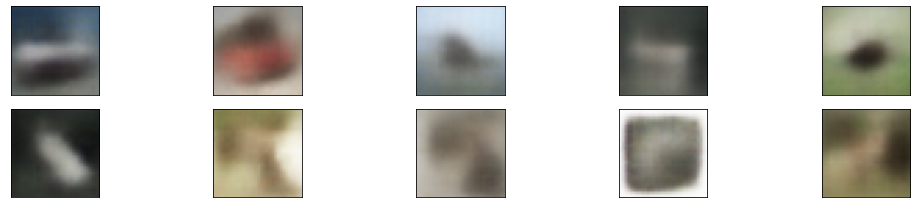

1875/1875 [==============================] - 10s 6ms/step - totalLoss: 625.8915 - reconstructionLoss: 609.7979 - KLloss: 16.0933
Epoch 80/100
1870/1875 [============================>.] - ETA: 0s - totalLoss: 625.8707 - reconstructionLoss: 609.7795 - KLloss: 16.0904

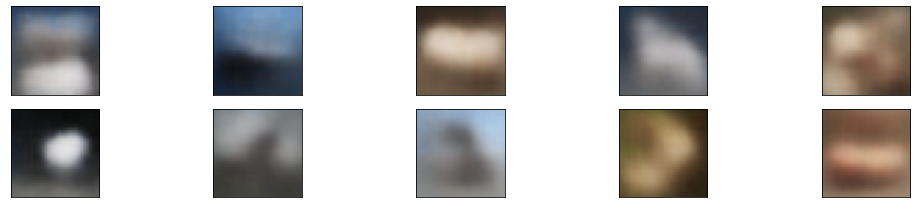

1875/1875 [==============================] - 10s 6ms/step - totalLoss: 625.8901 - reconstructionLoss: 609.7997 - KLloss: 16.0895
Epoch 81/100
1875/1875 [==============================] - ETA: 0s - totalLoss: 625.8871 - reconstructionLoss: 609.7977 - KLloss: 16.0900

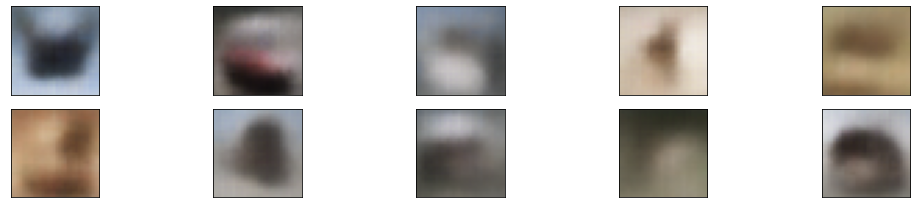

1875/1875 [==============================] - 10s 6ms/step - totalLoss: 625.8871 - reconstructionLoss: 609.7977 - KLloss: 16.0900
Epoch 82/100
1869/1875 [============================>.] - ETA: 0s - totalLoss: 625.8843 - reconstructionLoss: 609.7913 - KLloss: 16.0939

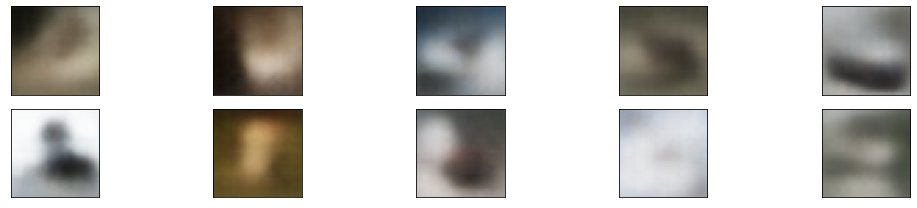

1875/1875 [==============================] - 10s 6ms/step - totalLoss: 625.8636 - reconstructionLoss: 609.7670 - KLloss: 16.0974
Epoch 83/100
1875/1875 [==============================] - ETA: 0s - totalLoss: 625.8809 - reconstructionLoss: 609.7880 - KLloss: 16.0928

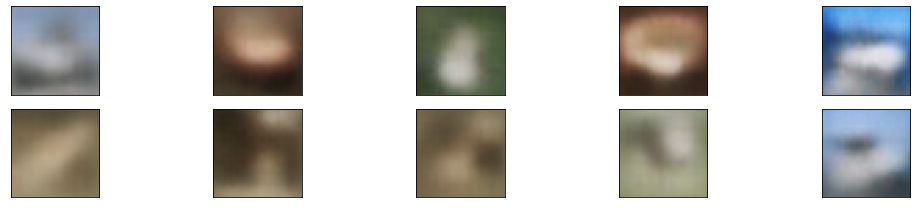

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.8809 - reconstructionLoss: 609.7880 - KLloss: 16.0928
Epoch 84/100
1873/1875 [============================>.] - ETA: 0s - totalLoss: 625.8720 - reconstructionLoss: 609.7469 - KLloss: 16.1255

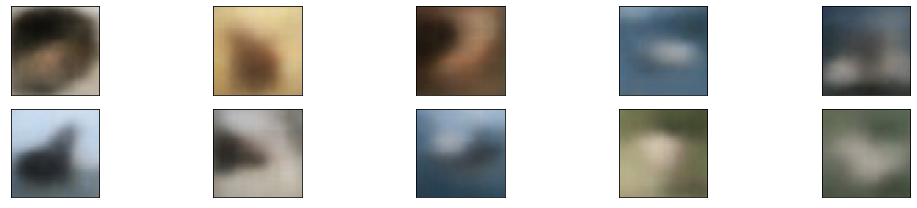

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.8842 - reconstructionLoss: 609.7603 - KLloss: 16.1243
Epoch 85/100
1872/1875 [============================>.] - ETA: 0s - totalLoss: 625.8593 - reconstructionLoss: 609.7776 - KLloss: 16.0828

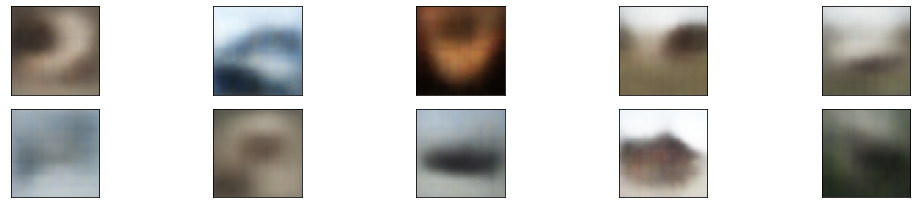

1875/1875 [==============================] - 10s 6ms/step - totalLoss: 625.8679 - reconstructionLoss: 609.7873 - KLloss: 16.0818
Epoch 86/100
1874/1875 [============================>.] - ETA: 0s - totalLoss: 625.8516 - reconstructionLoss: 609.7591 - KLloss: 16.0925

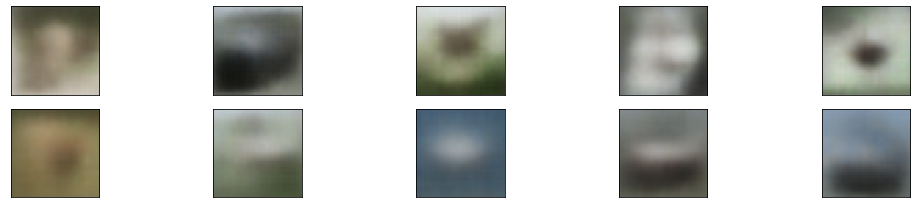

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.8569 - reconstructionLoss: 609.7647 - KLloss: 16.0921
Epoch 87/100
1868/1875 [============================>.] - ETA: 0s - totalLoss: 625.8824 - reconstructionLoss: 609.7599 - KLloss: 16.1217

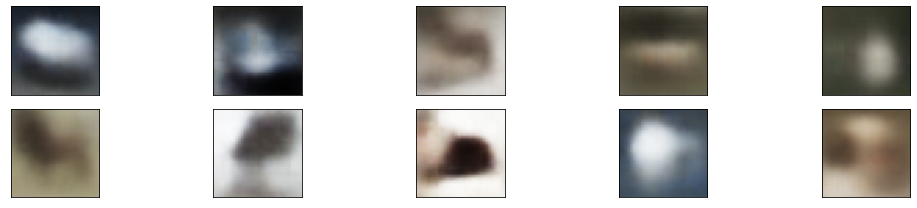

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.8781 - reconstructionLoss: 609.7572 - KLloss: 16.1202
Epoch 88/100
1872/1875 [============================>.] - ETA: 0s - totalLoss: 625.8481 - reconstructionLoss: 609.7465 - KLloss: 16.1011

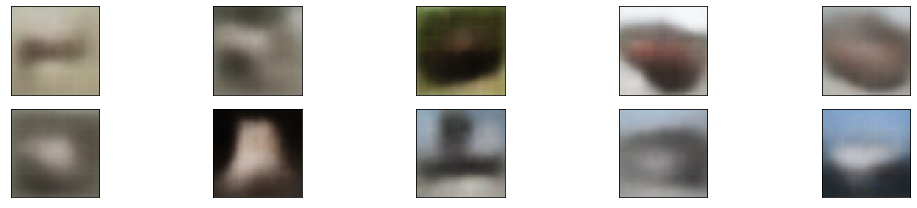

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.8456 - reconstructionLoss: 609.7435 - KLloss: 16.1016
Epoch 89/100
1866/1875 [============================>.] - ETA: 0s - totalLoss: 625.8439 - reconstructionLoss: 609.7560 - KLloss: 16.0873

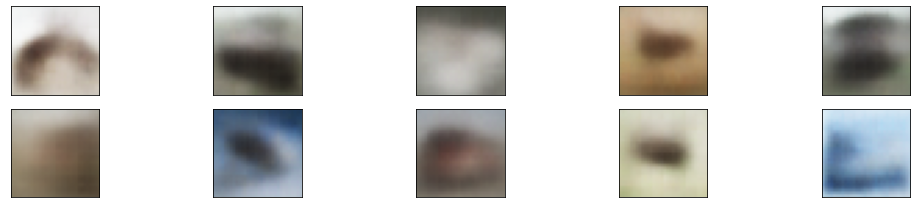

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.8256 - reconstructionLoss: 609.7385 - KLloss: 16.0863
Epoch 90/100
1870/1875 [============================>.] - ETA: 0s - totalLoss: 625.8203 - reconstructionLoss: 609.7226 - KLloss: 16.0975

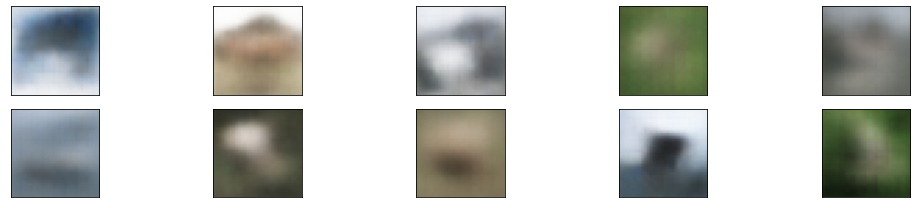

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.8483 - reconstructionLoss: 609.7517 - KLloss: 16.0965
Epoch 91/100
1870/1875 [============================>.] - ETA: 0s - totalLoss: 625.8289 - reconstructionLoss: 609.7396 - KLloss: 16.0894

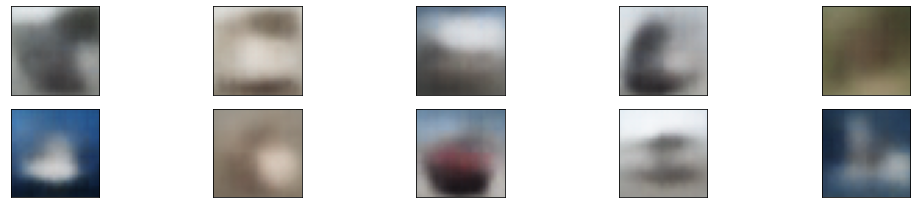

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.8241 - reconstructionLoss: 609.7356 - KLloss: 16.0885
Epoch 92/100
1869/1875 [============================>.] - ETA: 0s - totalLoss: 625.8521 - reconstructionLoss: 609.7633 - KLloss: 16.0889

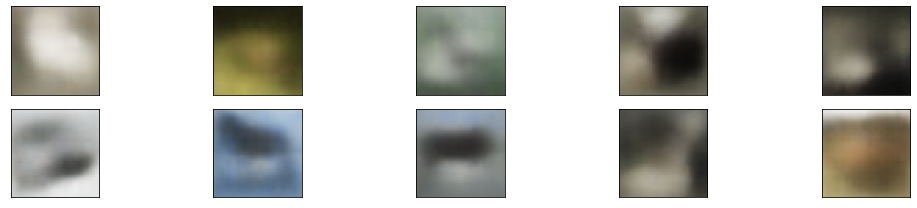

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.8469 - reconstructionLoss: 609.7553 - KLloss: 16.0916
Epoch 93/100
1875/1875 [==============================] - ETA: 0s - totalLoss: 625.7913 - reconstructionLoss: 609.7047 - KLloss: 16.0871

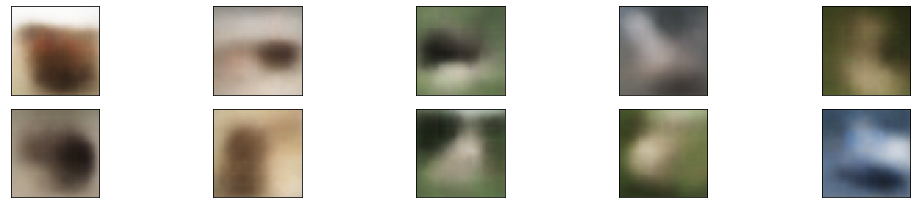

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.7913 - reconstructionLoss: 609.7047 - KLloss: 16.0871
Epoch 94/100
1873/1875 [============================>.] - ETA: 0s - totalLoss: 625.8165 - reconstructionLoss: 609.7248 - KLloss: 16.0922

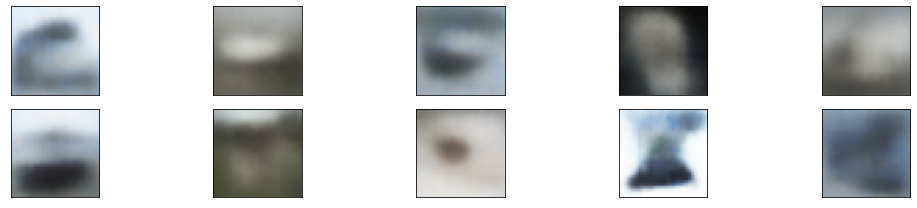

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.8373 - reconstructionLoss: 609.7471 - KLloss: 16.0907
Epoch 95/100
1873/1875 [============================>.] - ETA: 0s - totalLoss: 625.8365 - reconstructionLoss: 609.7369 - KLloss: 16.0997

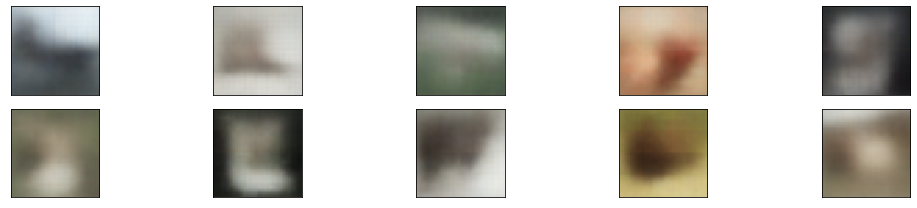

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.8384 - reconstructionLoss: 609.7391 - KLloss: 16.0995
Epoch 96/100
1873/1875 [============================>.] - ETA: 0s - totalLoss: 625.8395 - reconstructionLoss: 609.7367 - KLloss: 16.1029

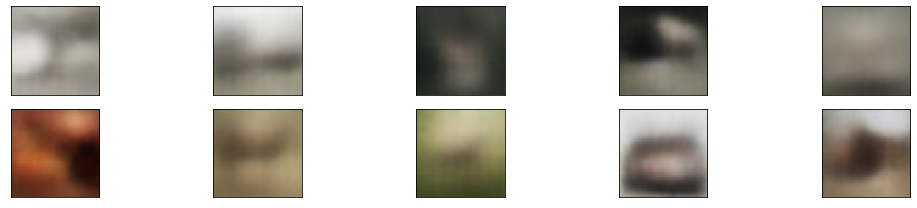

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.8319 - reconstructionLoss: 609.7278 - KLloss: 16.1042
Epoch 97/100
1872/1875 [============================>.] - ETA: 0s - totalLoss: 625.8275 - reconstructionLoss: 609.7266 - KLloss: 16.1006

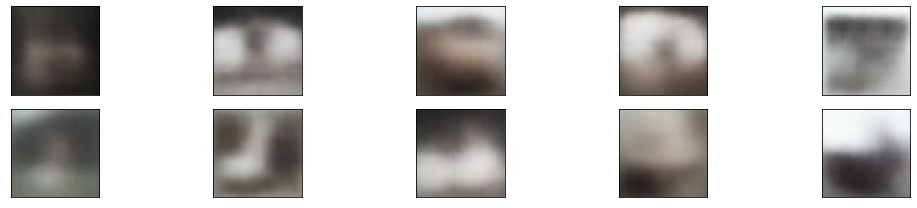

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.8241 - reconstructionLoss: 609.7232 - KLloss: 16.1006
Epoch 98/100
1868/1875 [============================>.] - ETA: 0s - totalLoss: 625.7945 - reconstructionLoss: 609.7000 - KLloss: 16.0942

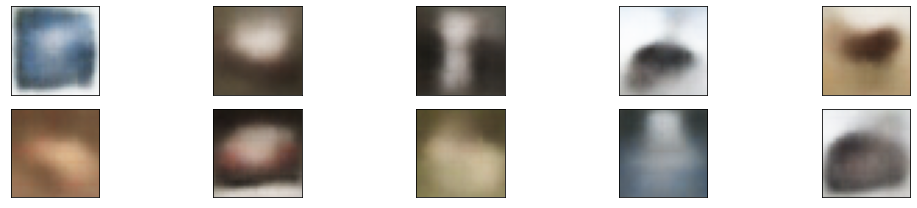

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.8021 - reconstructionLoss: 609.7081 - KLloss: 16.0938
Epoch 99/100
1872/1875 [============================>.] - ETA: 0s - totalLoss: 625.8077 - reconstructionLoss: 609.7007 - KLloss: 16.1061

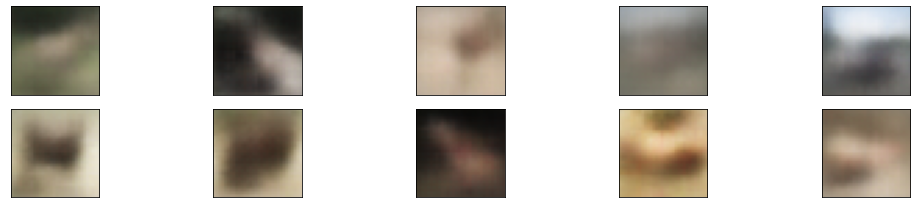

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.8115 - reconstructionLoss: 609.7045 - KLloss: 16.1060
Epoch 100/100
1867/1875 [============================>.] - ETA: 0s - totalLoss: 625.7930 - reconstructionLoss: 609.6746 - KLloss: 16.1186

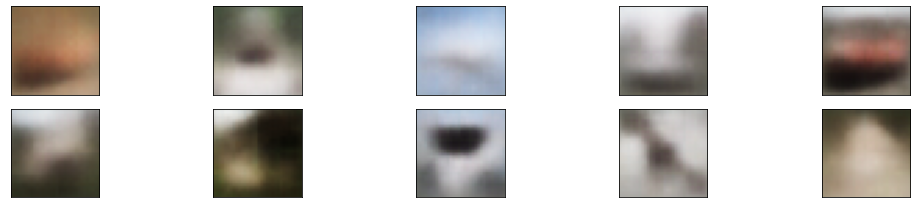

1875/1875 [==============================] - 11s 6ms/step - totalLoss: 625.8122 - reconstructionLoss: 609.6956 - KLloss: 16.1167


In [ ]:
# create VAE
vae = VAE(encoder, decoder)

# compile vae with Adam optimizer
vae.compile(optimizer=keras.optimizers.Adam())
# Show pre-training images
vae_generate()    

history = vae.fit(dataset_images, epochs=100, callbacks=[customCallback(num_images=10)])

In [ ]:
 import pickle
 with open('/models', 'wb') as filep:
        pickle.dump(history.history, filep)

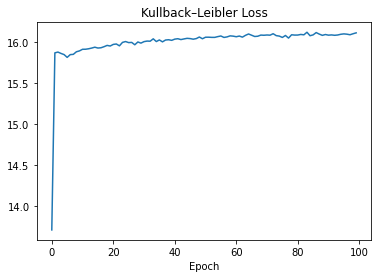

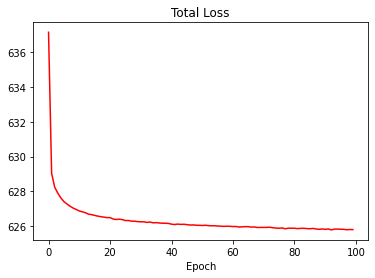

In [ ]:
# Get losses from each epoch 
totalLoss = (history.history)['totalLoss']
reconstructionLoss = (history.history)['reconstructionLoss']
KLloss = (history.history)['KLloss']

#plt.plot(totalLoss, label='totalLoss', color='blue')
#plt.plot(reconstructionLoss, label='reconstructionLoss', color='red')
plt.plot(KLloss, label='KLloss')
plt.xlabel('Epoch')
plt.title('Kullback–Leibler Loss')
plt.show()

plt.plot(totalLoss, label='totalLoss', color='red')
plt.title('Total Loss')
plt.xlabel('Epoch')
plt.show()

In [ ]:
## Evaluating image quality w/ FID 

# define model
inception = keras.applications.InceptionV3(include_top=False, pooling='avg', input_shape=(299,299,3))

87924736/87910968 [==============================] - 0s 0us/step


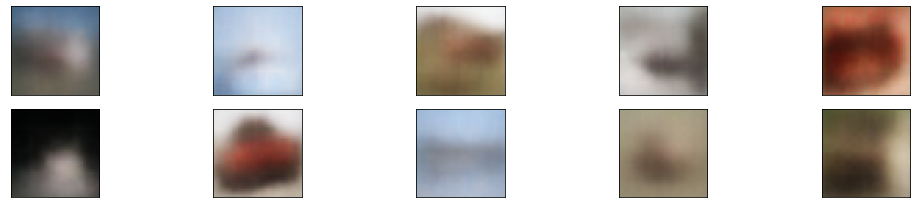

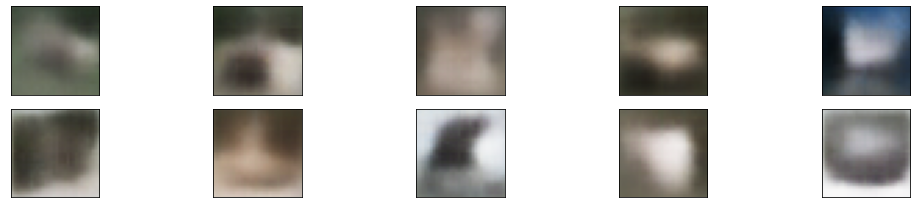

FID (generated vs generated): 0.065
FID (generated vs real): 2.532


In [ ]:
from skimage.transform import resize
from scipy.linalg import sqrtm
from keras.applications.inception_v3 import preprocess_input

# upscale image to new_shape
def upscale(images, new_shape):
	result = list()
	for image in images:
		# resize 
		upscaled = resize(image, new_shape, 0)
		# store
		result.append(upscaled)
	return np.asarray(result)
 
def getFID(model, img1, img2):
  # let the DCGAN run on two images
	activation1 = model.predict(img1)
	activation2 = model.predict(img2)
 
	# calculate mean and covariance 
	mean1, cov1 = activation1.mean(axis=0), np.cov(activation1, rowvar=False)
	mean2, cov2 = activation2.mean(axis=0), np.cov(activation2, rowvar=False)
 
	# get mean squared difference 
	meanDiff = np.sum((mean1 - mean2)**2.0)
 
	# calculate sqrt of product between cov
	sigmaMean = sqrtm(cov1.dot(cov2))
 
	if np.iscomplexobj(sigmaMean):
		sigmaMean = sigmaMean.real
	# calculate score
	FID = meanDiff + np.trace(cov1 + cov2 - 2.0 * sigmaMean)
	return FID

# define collections of 10 fake images
fakeSet1 = vae_generate()
fakeSet2 = vae_generate()

# preprocess sets
fakeSet1 = fakeSet1.astype('float32')
fakeSet2 = fakeSet2.astype('float32')

fakeSet1 = upscale(fakeSet1, (299,299,3))
fakeSet2 = upscale(fakeSet2, (299,299,3))

fakeSet1 = preprocess_input(fakeSet1)
fakeSet2 = preprocess_input(fakeSet2)

# FID between two sets of generated images
fid = getFID(inception, fakeSet1, fakeSet2)
print('FID (generated vs generated): %.3f' % fid)

fakeSet3 = np.zeros((10,32,32,3))
# get 10 real images
for i in range(10):
  rand = np.random.randint(0, dataset_images.shape[0])
  image = dataset_images[rand]
  fakeSet3[i] = dataset_images[rand]

# preprocessing
fakeSet3 = fakeSet3.astype('float32')
fakeSet3 = upscale(fakeSet3, (299,299,3))
fakeSet3 = preprocess_input(fakeSet3)

# FID between generated and real images
fid = getFID(inception, fakeSet1, fakeSet3)
print('FID (generated vs real): %.3f' % fid)